<a href="https://colab.research.google.com/github/Lucy-wo/API-Challenge/blob/master/Lucy_ImageCleansing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Note book overview
1. review the dataset summary
2. find broken images
3. find duplicated images
4. find clusers
5. find outliers
6. remove them then to do the furture cleansing
7. review the image arrary
8. display RGB
9. converting BGR to RGB
10. resizing image
11. sharpen image

In [ ]:
# importing some usefull librariies
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from tqdm.auto import tqdm
import random
import pandas as pd
import os
from itertools import chain
import os.path
import imagehash
import multiprocessing
import matplotlib.pylab as plt
from skimage import io
import glob
import glob, os, json, cv2, gc, shutil
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import backend as K
from tqdm.notebook import tqdm

plt.style.use('ggplot')
pd.set_option('display.max_colwidth', None)

In [ ]:
import IPython.core.display as di
from IPython.display import display, HTML
from IPython.display import Audio
display(HTML("<style>.container { width:100% !important; }</style>"))
di.display_html("""
('<style>.cell { margin-bottom: 40px !important;}</style>')
""", raw=True)

from IPython.display import display, HTML
display(HTML("<style>.container { height:100% !important; }</style>"))

('')

In [ ]:
# pip install imagehash

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 5.4 MB/s eta 0:00:00


In [ ]:
#pip install fastdup

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.2/75.2 MB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 33.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 257.5/257.5 kB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.8/143.8 kB 15.6 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 2.0.7
    Uninstalling urllib3-2.0.7:
      Successfully uninstalled urllib3-2.0.7
  Attempting uninstall: charset-normalizer
    Found existing installation: charset-normalizer 3.3.2
    Uninstalling charset-normalizer-3.3.2:
      Successfully uninstalled charset-normalizer-3.3.2
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
ERROR: pip's dependency resolver does not currently take into account all th

In [ ]:
import fastdup
fastdup.__version__

'1.87'

# Data Preprocessing - Lucy

In [ ]:
df = glob.glob('/content/data/*.JPG')

In [ ]:
# Dataset Analysis Summary
import fastdup
fd = fastdup.create(work_dir="/out/",
                    input_dir="/content/data/")
fd.run(ccthreshold=0.9)

FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.
fastdup C++ info received:  2024-02-04 01:37:57 [INFO] Going to loop over dir data
2024-02-04 01:37:57 [INFO] Found total 22 images to run on, 22 train, 0 test, name list 22, counter 22 
2024-02-04 01:37:58 [INFO] Found total 22 images to run on
2024-02-04 01:37:58 [INFO] 2) Finished write_index() NN model
2024-02-04 01:37:58 [INFO] Stored nn model index file /out/nnf.index
2024-02-04 01:37:58 [INFO] Total time took 1004 ms
2024-02-04 01:37:58 [INFO] Found a total of 0 fully identical images (d>0.990), which are 0.00 % of total graph edges
2024-02-04 01:37:58 [INFO] Found a total of 0 nearly identical images(d>0.980), which are 0.00 % of total graph edges
2024-02-04 01:37:58 [INFO] Found a total of 14 above threshold images (d>0.900), which are 31.82 % of total graph edges
2024-02-04 01:37:58 [INFO] Found a total of 2 outlier images         (d<0.050), which are 4.55 % of total graph edges
2024-02-04 01:37:58 [IN

0

# we can see the dataset summary including:
1. how many images
2. similarity
3. cluster
4. outliers

In [ ]:
fd.summary()


 ########################################################################################

Dataset Analysis Summary: 

    Dataset contains 22 images
    Valid images are 100.00% (22) of the data, invalid are 0.00% (0) of the data
    Similarity:  40.91% (9) belong to 2 similarity clusters (components).
    59.09% (13) images do not belong to any similarity cluster.
    Largest cluster has 20 (90.91%) images.
    For a detailed analysis, use `.connected_components()`
(similarity threshold used is 0.9, connected component threshold used is 0.9).

    Outliers: 9.09% (2) of images are possible outliers, and fall in the bottom 5.00% of similarity values.
    For a detailed list of outliers, use `.outliers()`.



['Dataset contains 22 images',
 'Valid images are 100.00% (22) of the data, invalid are 0.00% (0) of the data',
 'Similarity:  40.91% (9) belong to 2 similarity clusters (components).',
 '59.09% (13) images do not belong to any similarity cluster.',
 'Largest cluster has 20 (90.91%) images.',
 'For a detailed analysis, use `.connected_components()`\n(similarity threshold used is 0.9, connected component threshold used is 0.9).\n',
 'Outliers: 9.09% (2) of images are possible outliers, and fall in the bottom 5.00% of similarity values.',
 'For a detailed list of outliers, use `.outliers()`.\n']

# Find if there are any Broken Images

In [ ]:
# No broken images
fd.invalid_instances()

,filename,index,error_code,is_valid,fd_index


# Duplicates image pairs

Generating gallery:   0%|          | 0/5 [00:00<?, ?it/s]

Stored similarity visual view in  /out/galleries/duplicates.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



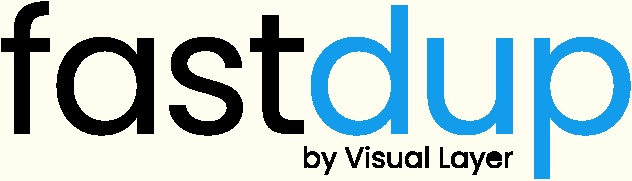
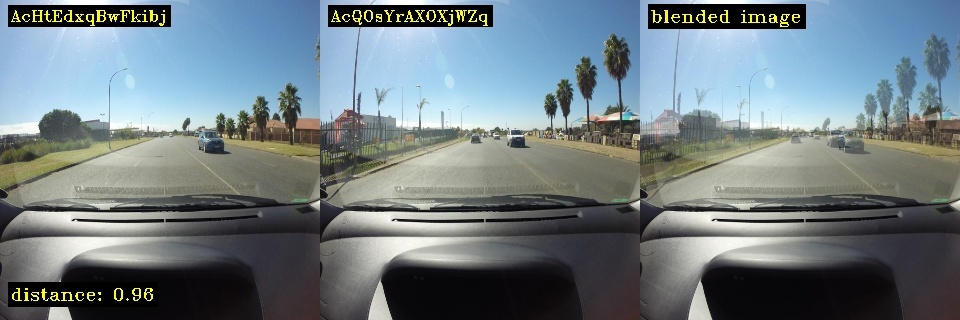
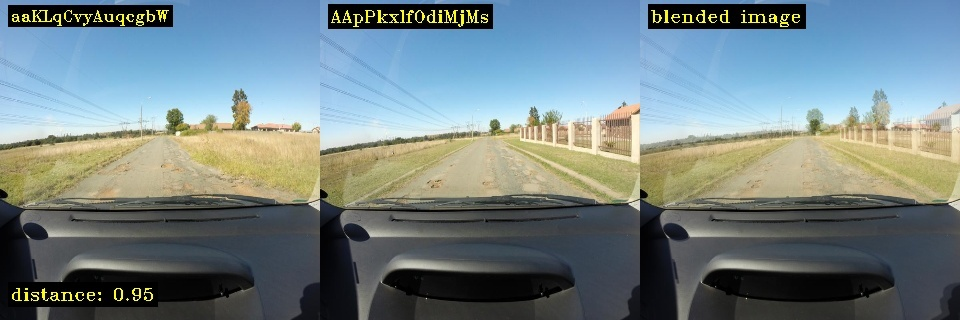
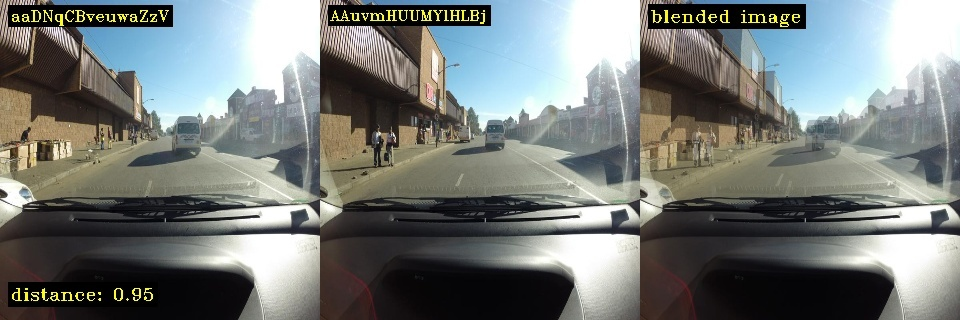

0

In [ ]:
fd.vis.duplicates_gallery(num_images=5)

# image clusters

Generating gallery:   0%|          | 0/3 [00:00<?, ?it/s]

Finished OK. Components are stored as image files /out/galleries/components_[index].jpg
Stored components visual view in  /out/galleries/components.html
Execution time in seconds 0.7
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



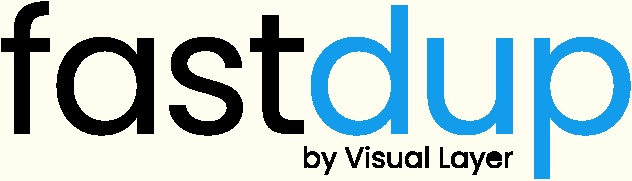
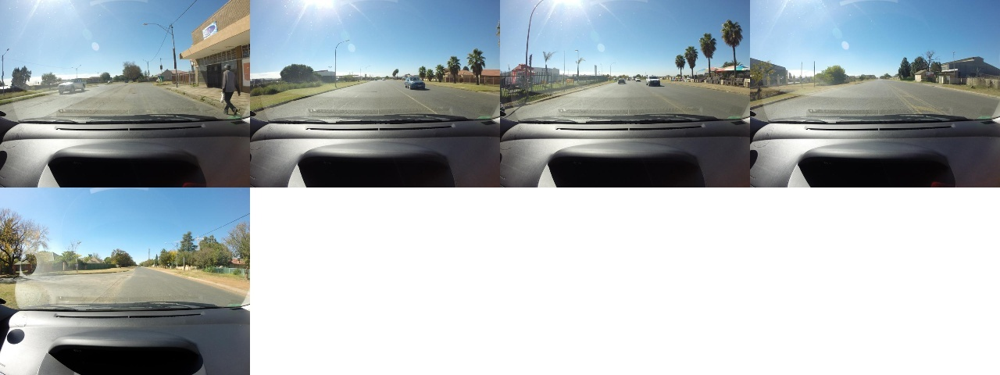
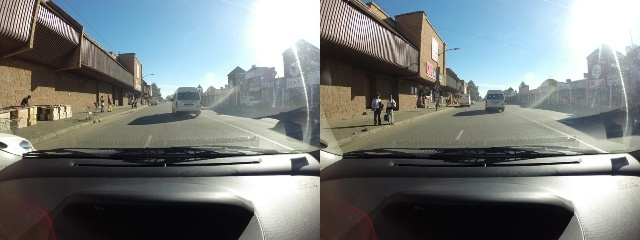
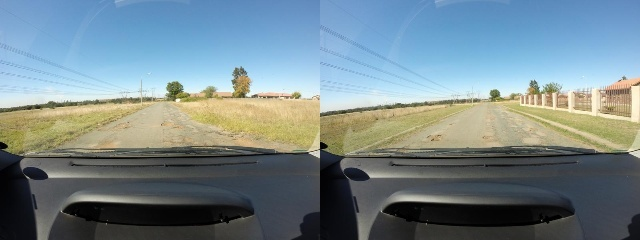

0

In [ ]:
fd.vis.component_gallery(num_images=5)

# List of Duplicates

Now let's single out all duplicates and near-duplicates by running using the connected components function:

In [ ]:
connected_components_df , _ = fd.connected_components()
connected_components_df = connected_components_df.rename(columns={"filename": "img_filename"})
connected_components_df.head()

,index,component_id,sum,count,mean_distance,min_distance,max_distance,img_filename,error_code,is_valid,fd_index
0,1,1,3.7811,4.0,0.9453,0.9453,0.9453,data/aaDNqCBveuwaZzV.JPG,VALID,True,1
1,2,2,3.8151,4.0,0.9538,0.9538,0.9538,data/aaKLqCvyAuqcgbW.JPG,VALID,True,2
2,4,2,3.8151,4.0,0.9538,0.9538,0.9538,data/AApPkxlfOdiMjMs.JPG,VALID,True,4
3,5,1,3.7811,4.0,0.9453,0.9453,0.9453,data/AAuvmHUUMYlHLBj.JPG,VALID,True,5
4,12,10,18.6332,20.0,0.9317,0.9010,0.9614,data/aBlHFmxdJwJnAra.JPG,VALID,True,12


# Let's now write a utility function to get the clusters:

In [ ]:
# a function to group connected components
def get_clusters(df, sort_by='count', min_count=2, ascending=False):
    # columns to aggregate
    agg_dict = {'img_filename': list, 'mean_distance': max, 'count': len}

    if 'label' in df.columns:
        agg_dict['label'] = list

    # filter by count
    df = df[df['count'] >= min_count]

    # group and aggregate columns
    grouped_df = df.groupby('component_id').agg(agg_dict)

    # sort
    grouped_df = grouped_df.sort_values(by=[sort_by], ascending=ascending)
    return grouped_df

clusters_df = get_clusters(connected_components_df)
clusters_df.head()

,img_filename,mean_distance,count
component_id,,,
10,"[data/aBlHFmxdJwJnAra.JPG, data/AcHtEdxqBwFkibj.JPG, data/AcQOsYrAXOXjWZq.JPG, data/acsrEGqQdjYAkaW.JPG, data/actktUiTQHjJEGw.JPG]",0.9317,5
1,"[data/aaDNqCBveuwaZzV.JPG, data/AAuvmHUUMYlHLBj.JPG]",0.9453,2
2,"[data/aaKLqCvyAuqcgbW.JPG, data/AApPkxlfOdiMjMs.JPG]",0.9538,2


The above shows the component (clusters) with the highest duplicates/near-duplicates.

Now let's keep one image from each cluster and remove the rest:

In [ ]:
# First sample from each cluster that is kept
cluster_images_to_keep = []
list_of_duplicates = []

for cluster_file_list in clusters_df.img_filename:
    # keep first file, discard rest
    keep = cluster_file_list[0]
    discard = cluster_file_list[1:]

    cluster_images_to_keep.append(keep)
    list_of_duplicates.extend(discard)

print(f"Found {len(set(list_of_duplicates))} highly similar images to discard")

Found 6 highly similar images to discard


In [ ]:
list_of_duplicates

['data/AcHtEdxqBwFkibj.JPG',
 'data/AcQOsYrAXOXjWZq.JPG',
 'data/acsrEGqQdjYAkaW.JPG',
 'data/actktUiTQHjJEGw.JPG',
 'data/AAuvmHUUMYlHLBj.JPG',
 'data/AApPkxlfOdiMjMs.JPG']

# Outliers

Generating gallery:   0%|          | 0/2 [00:00<?, ?it/s]

Stored outliers visual view in  /out/galleries/outliers.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



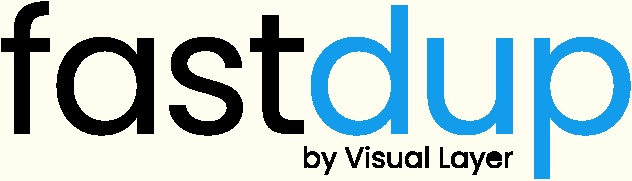
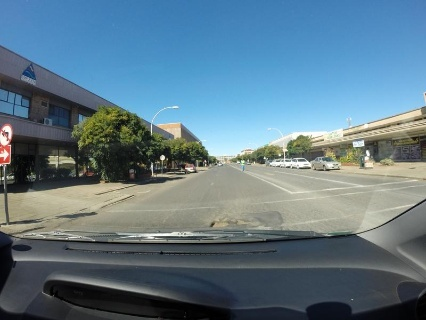
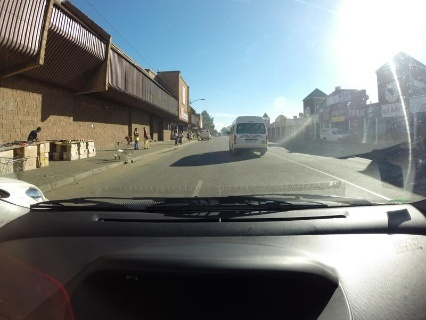

0

In [ ]:
fd.vis.outliers_gallery(num_images=5)


List of Outliers

Let's first get the outliers DataFrame:

In [ ]:
outlier_df = fd.outliers()
outlier_df.head()

,outlier,nearest,distance,filename_outlier,index_x,error_code_outlier,is_valid_outlier,fd_index_outlier,filename_nearest,index_y,error_code_nearest,is_valid_nearest,fd_index_nearest
0,7,14,0.803378,data/aazjfeBcQJWnIZi.JPG,7,VALID,True,7,data/aBptudGnlGlYYcn.JPG,14,VALID,True,14
1,1,12,0.824922,data/aaDNqCBveuwaZzV.JPG,1,VALID,True,1,data/aBlHFmxdJwJnAra.JPG,12,VALID,True,12


In [ ]:
#Let's treat all images with distance<0.68 as outliers:
outlier_df = outlier_df.rename(columns={"filename_outlier": "img_filename_outlier"})
list_of_outliers = outlier_df[outlier_df.distance < 0.68].img_filename_outlier.tolist()
list_of_outliers

[]

In [ ]:
list_of_broken_images = broken_images['filename'].to_list()
print(f"Broken: {len(list_of_broken_images)}")
print(f"Duplicates: {len(list_of_duplicates)}")
print(f"Outliers: {len(list_of_outliers)}")
problem_images = list_of_duplicates + list_of_broken_images + list_of_outliers

print(f"Total unique images: {len(set(problem_images))}")

Broken: 0
Duplicates: 6
Outliers: 0
Total unique images: 6


# Remove above problem images then do furtur cleansing

# Image Array (Height, Width, Channels)

Order is:  0
(600, 800, 3)


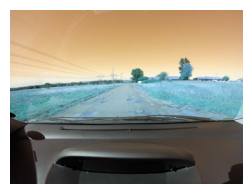

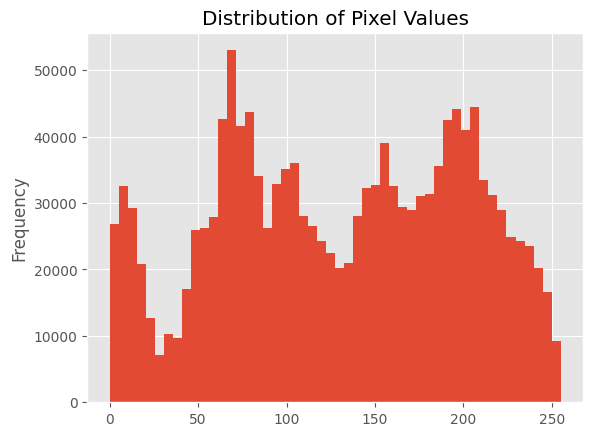

Order is:  1
(600, 800, 3)


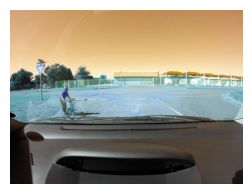

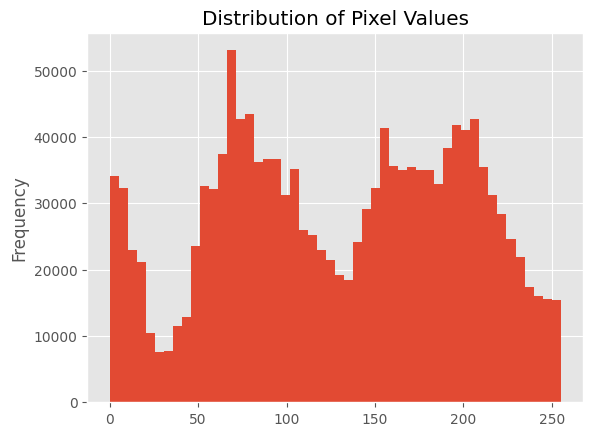

Order is:  2
(600, 800, 3)


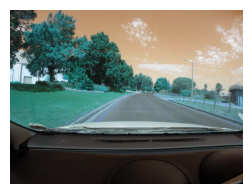

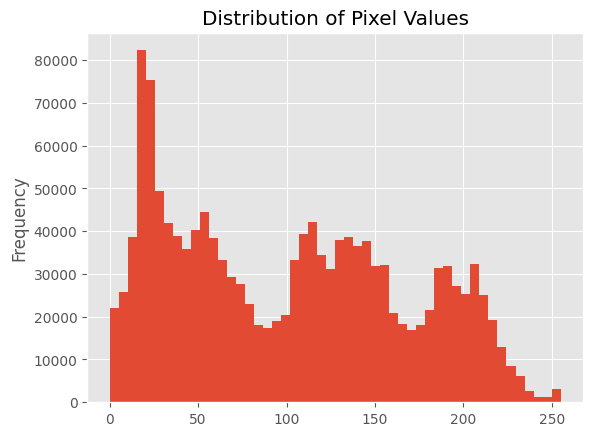

Order is:  3
(600, 800, 3)


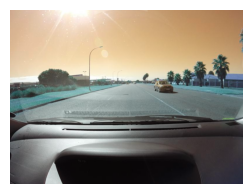

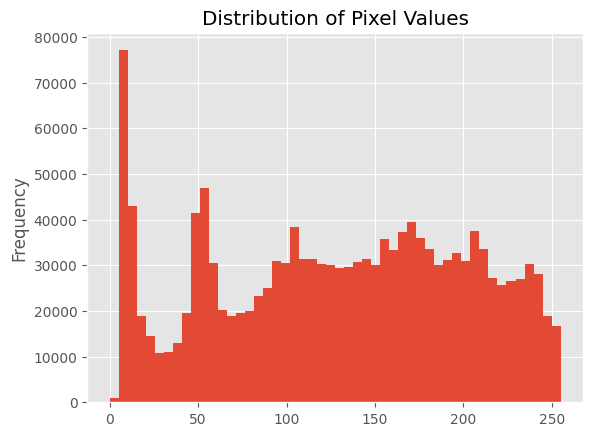

Order is:  4
(600, 800, 3)


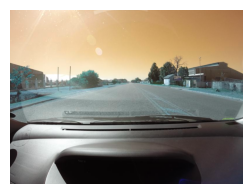

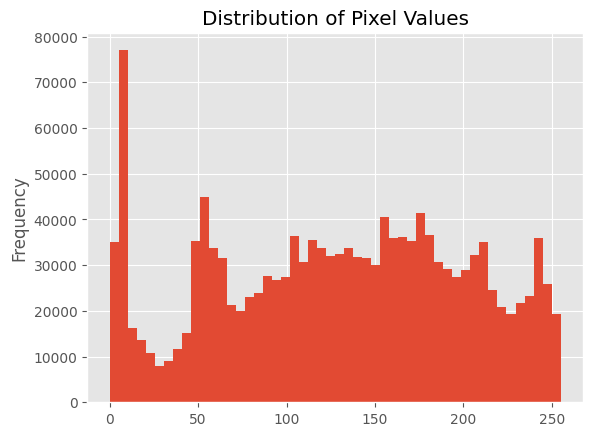

Order is:  5
(600, 800, 3)


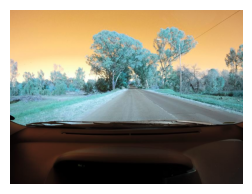

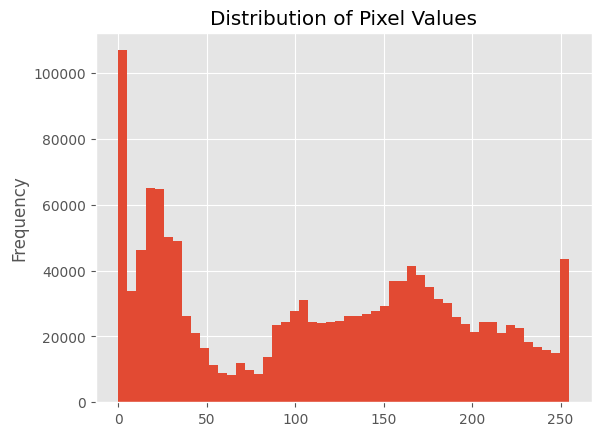

Order is:  6
(600, 800, 3)


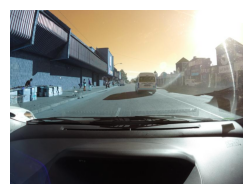

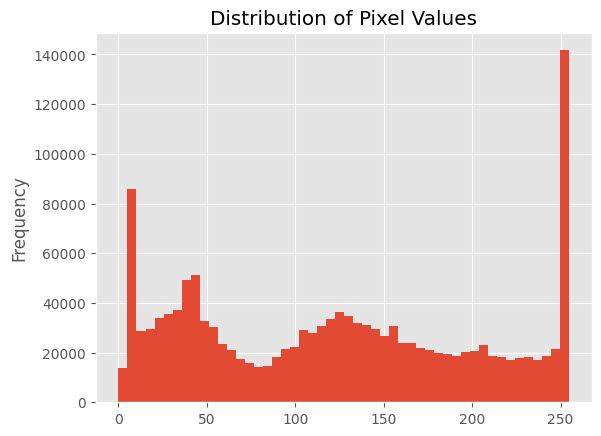

Order is:  7
(600, 800, 3)


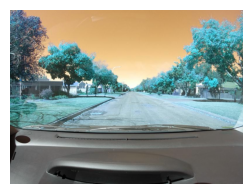

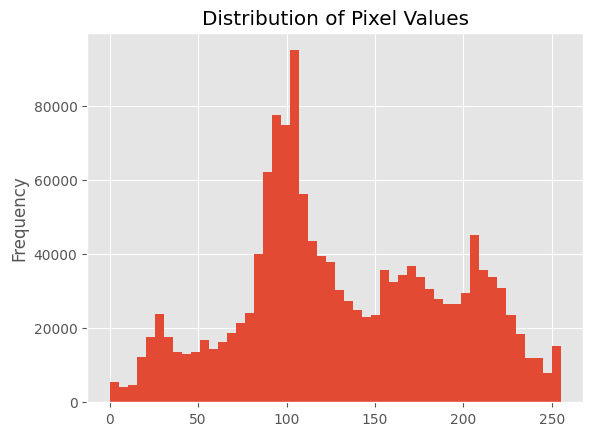

Order is:  8
(600, 800, 3)


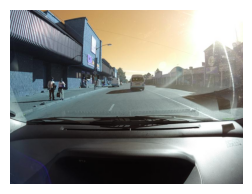

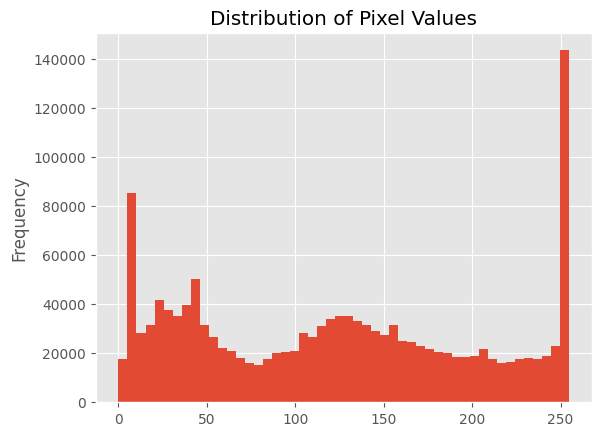

Order is:  9
(600, 800, 3)


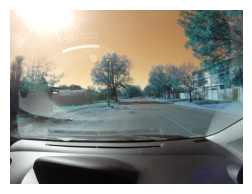

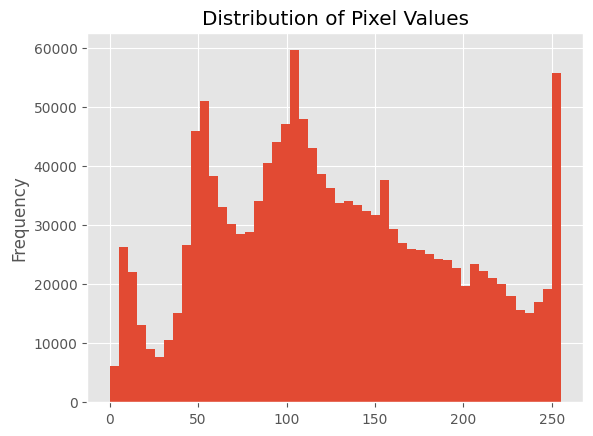

Order is:  10
(600, 800, 3)


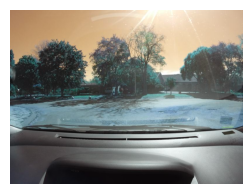

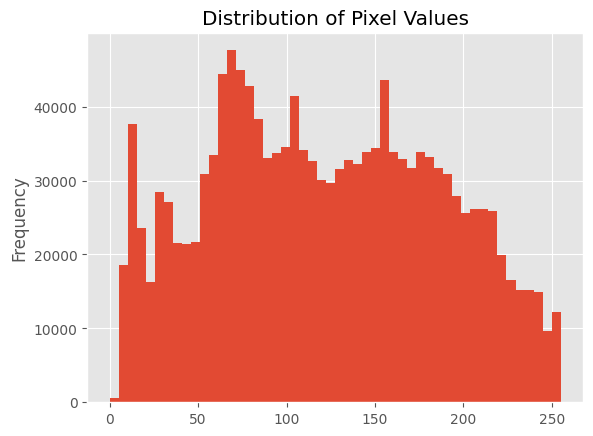

Order is:  11
(600, 800, 3)


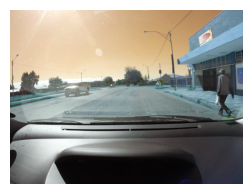

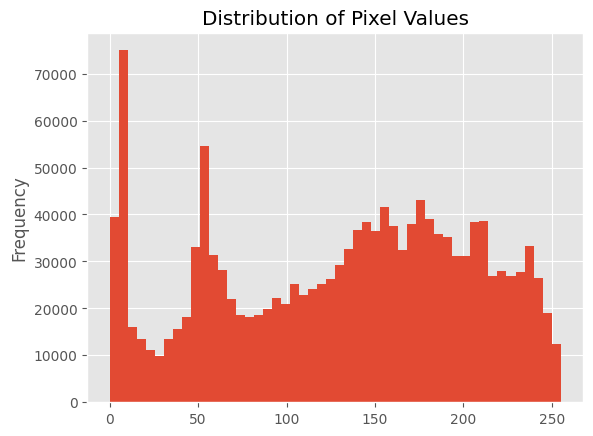

Order is:  12
(600, 800, 3)


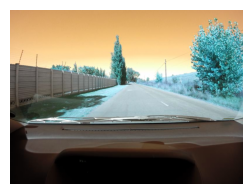

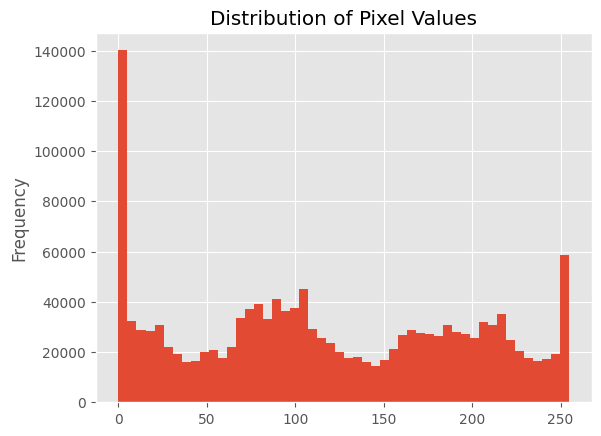

Order is:  13
(600, 800, 3)


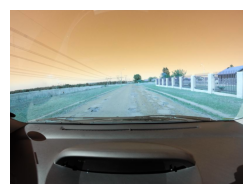

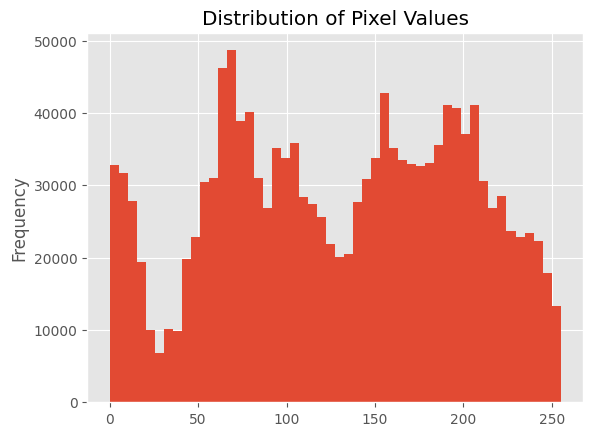

Order is:  14
(600, 800, 3)


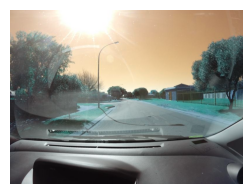

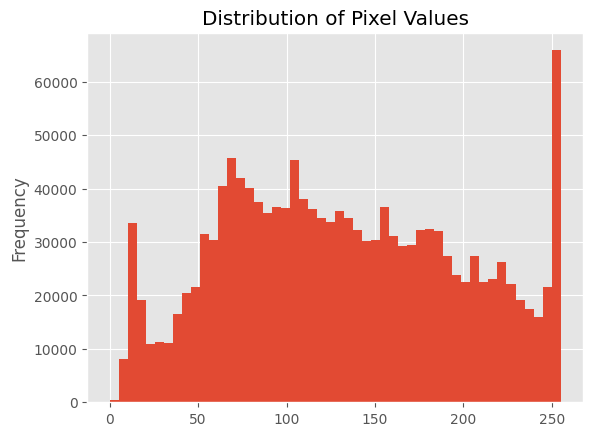

Order is:  15
(600, 800, 3)


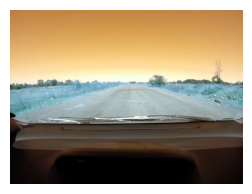

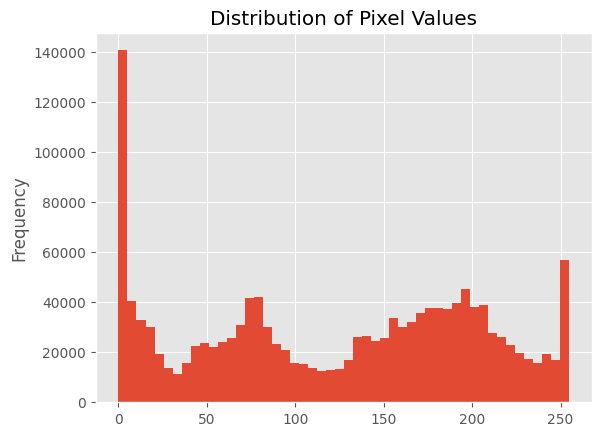

Order is:  16
(600, 800, 3)


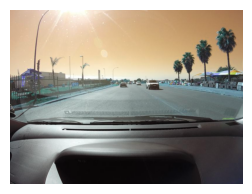

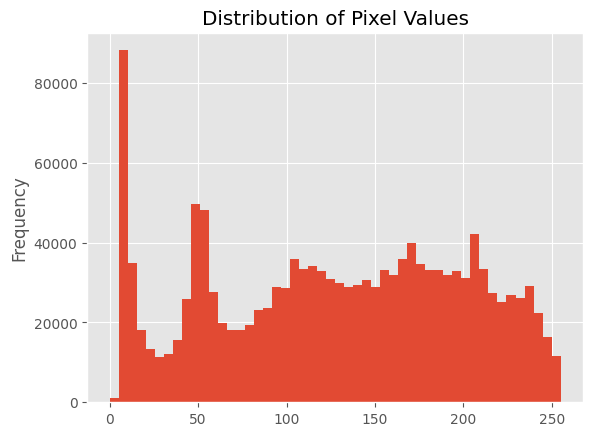

Order is:  17
(600, 800, 3)


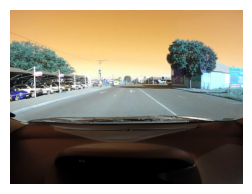

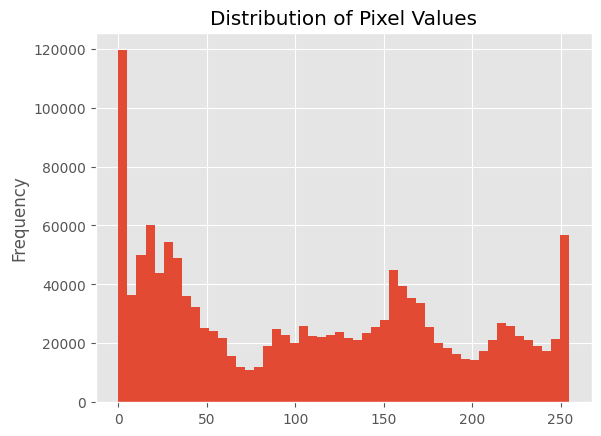

Order is:  18
(600, 800, 3)


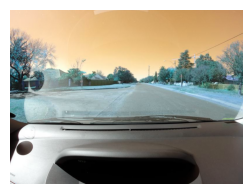

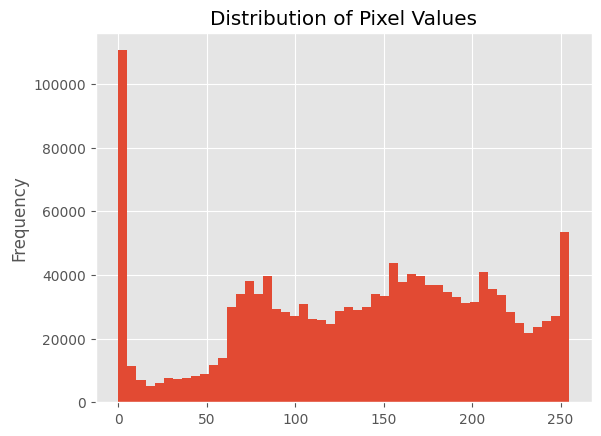

Order is:  19
(600, 800, 3)


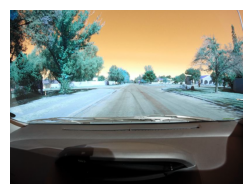

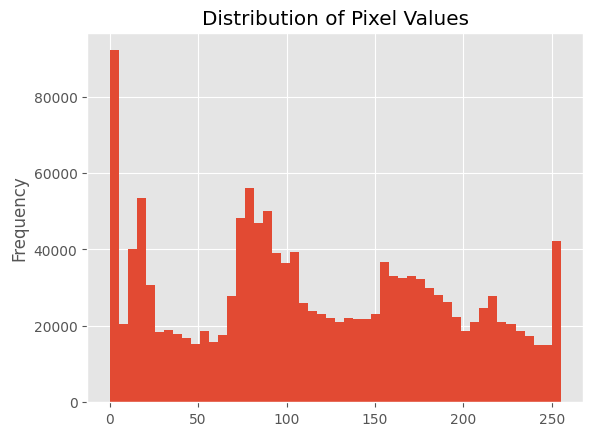

Order is:  20
(600, 800, 3)


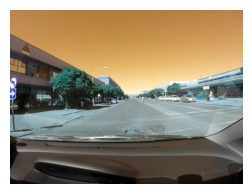

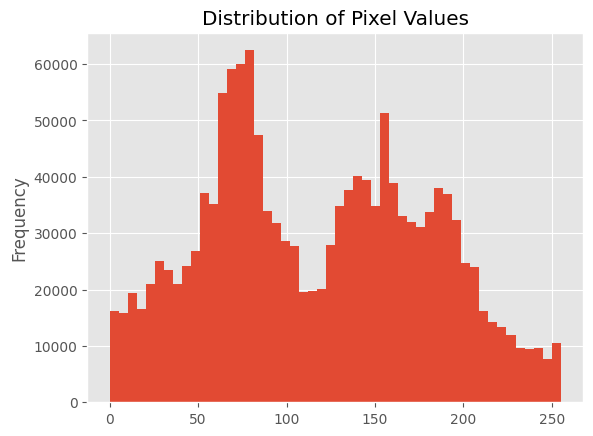

Order is:  21
(600, 800, 3)


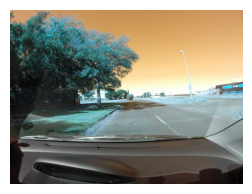

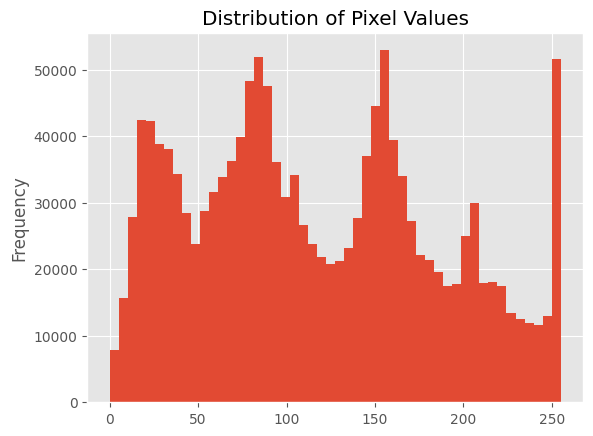

In [ ]:

for i in range(len(df)):
  if (i not in list_of_duplicates) and (i not in list_of_broken_images) and (i not in list_of_outliers):

    img_cv2 = cv2.imread(df[i])

    #Print image size
    print('Order is: ',i)
    print(img_cv2.shape)

    #Display image
    fig, ax = plt.subplots(figsize=(3, 3))
    ax.imshow(img_cv2)
    ax.axis('off')
    plt.show()

    #Display image pixel value
    pd.Series(img_cv2.flatten()).plot(kind='hist',
                                    bins=50,
                                    title='Distribution of Pixel Values')
    plt.show()

# Display RGB Channels & Converting from BGR to RGB & Resizing and Scaling & Sharpen Image
An RGB image has three channels: red, green, and blue. RGB channels roughly follow the color receptors in the human eye, and are used in computer displays and image scanners.



Order is  0
diaplay image RGB


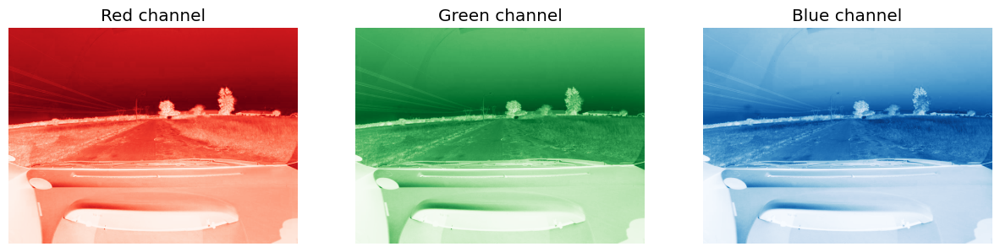

Converting from BRG to RGB


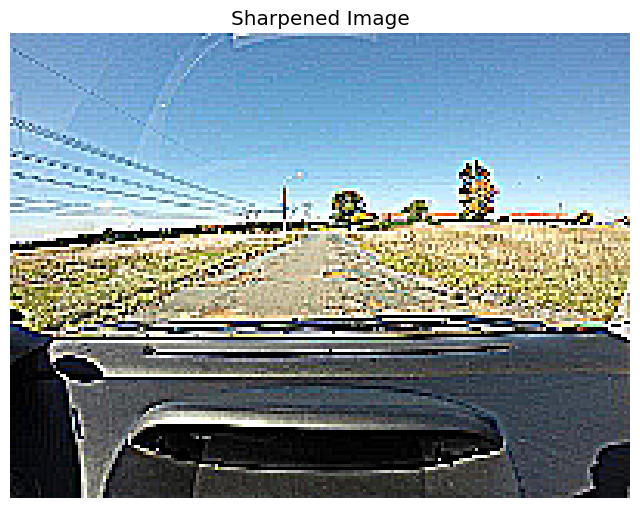

-------
Order is  1
diaplay image RGB


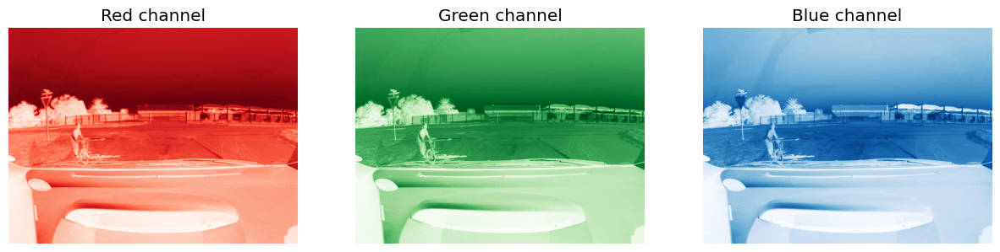

Converting from BRG to RGB


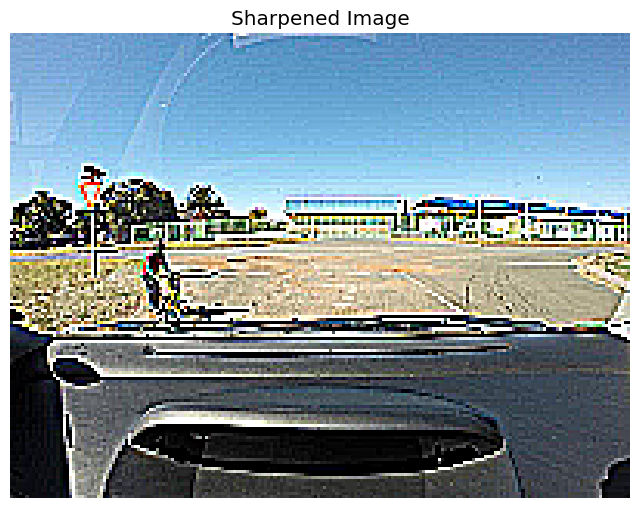

-------
Order is  2
diaplay image RGB


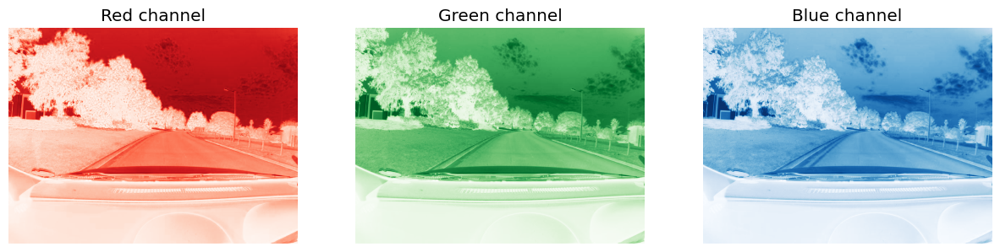

Converting from BRG to RGB


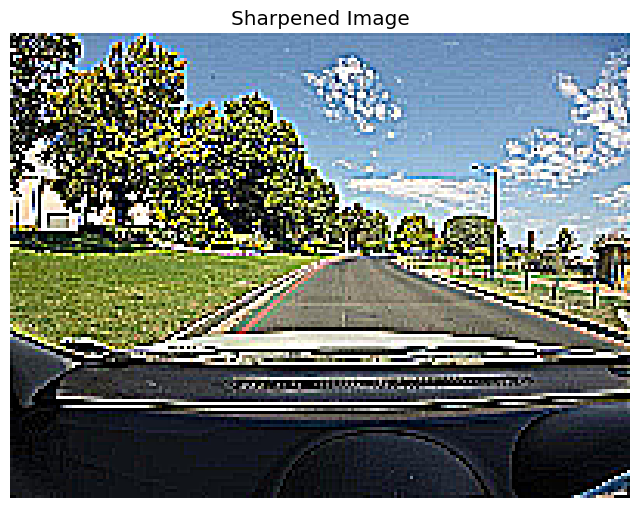

-------
Order is  3
diaplay image RGB


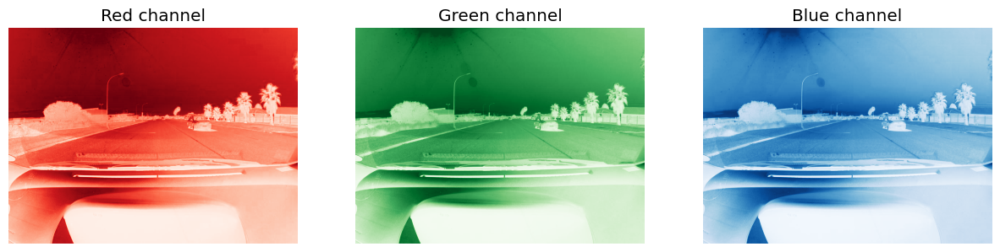

Converting from BRG to RGB


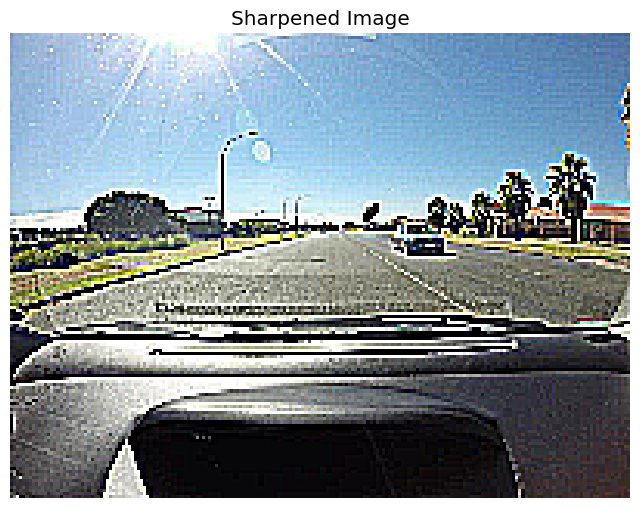

-------
Order is  4
diaplay image RGB


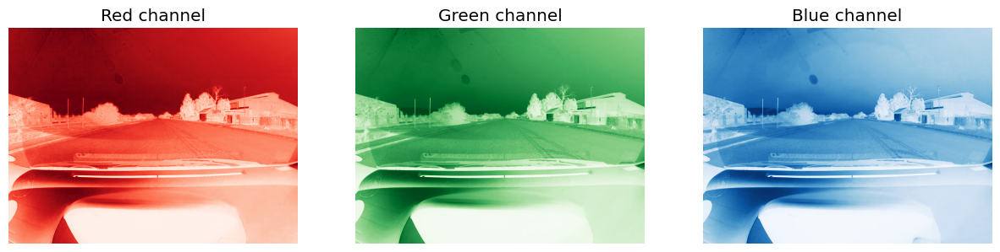

Converting from BRG to RGB


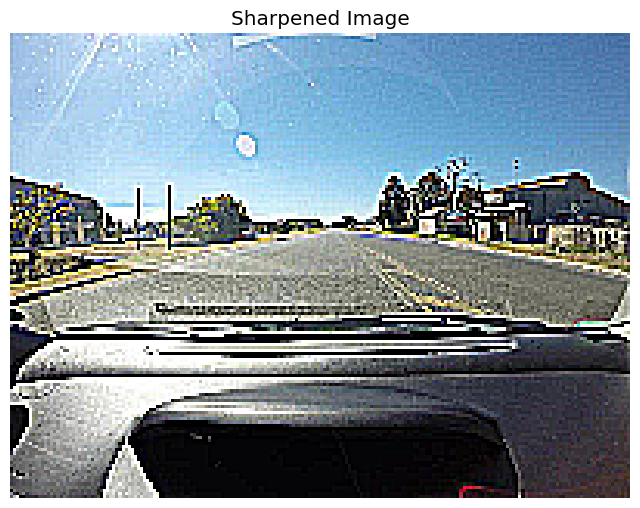

-------
Order is  5
diaplay image RGB


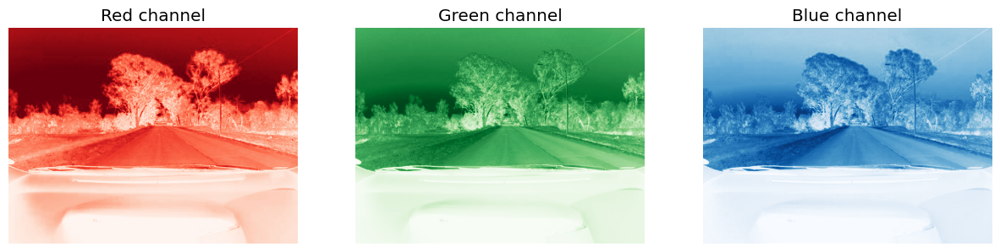

Converting from BRG to RGB


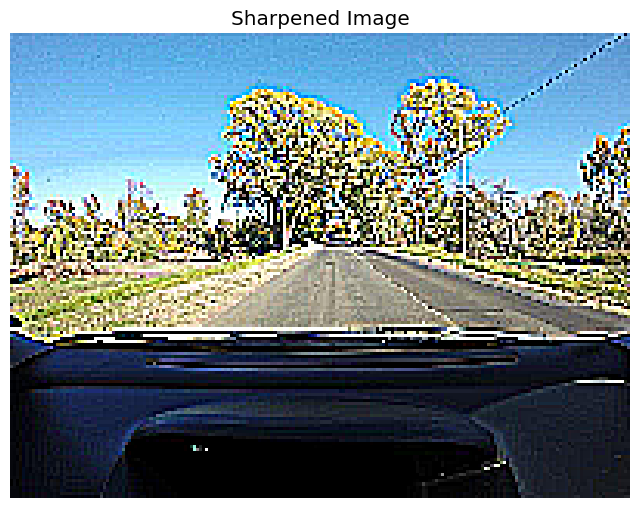

-------
Order is  6
diaplay image RGB


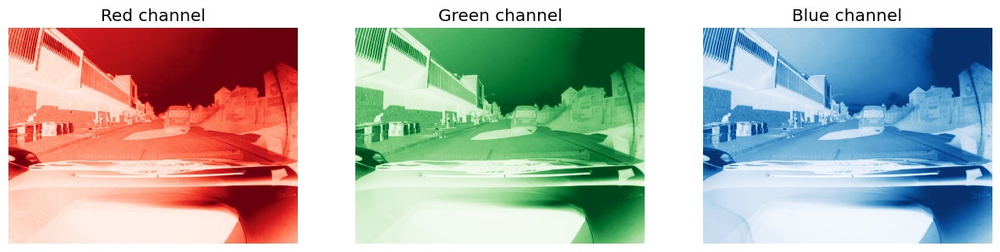

Converting from BRG to RGB


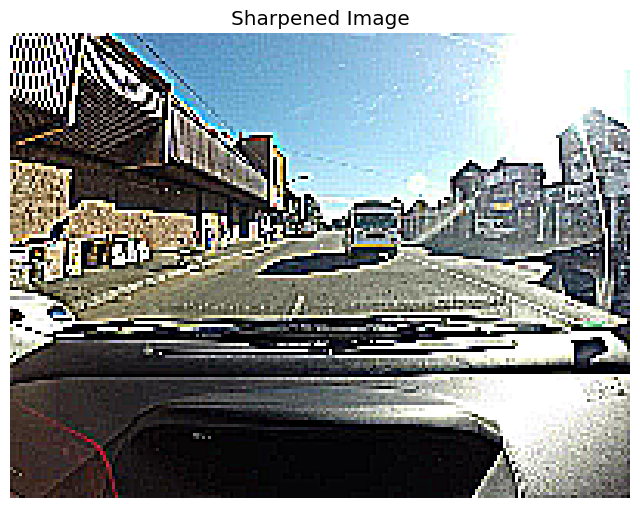

-------
Order is  7
diaplay image RGB


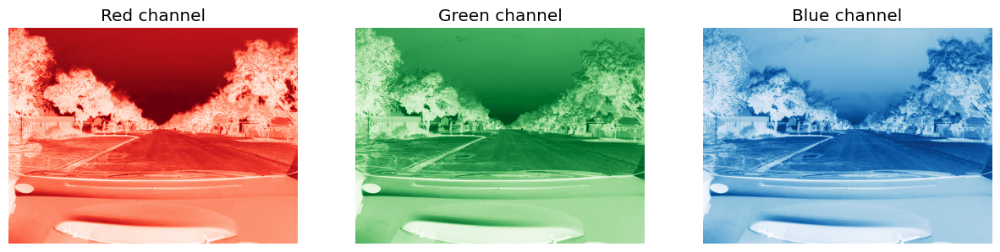

Converting from BRG to RGB


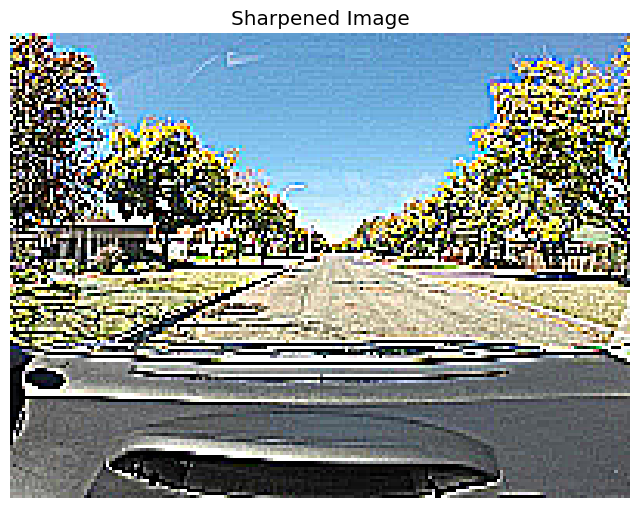

-------
Order is  8
diaplay image RGB


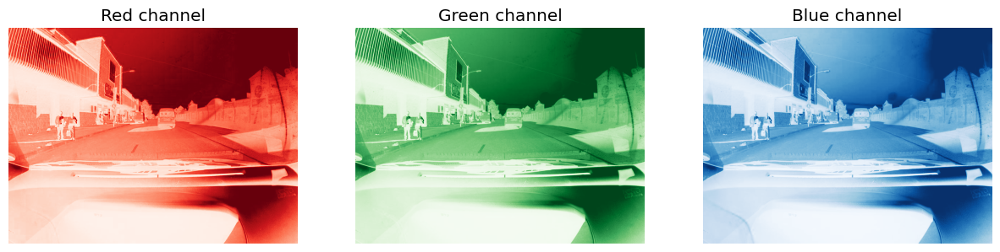

Converting from BRG to RGB


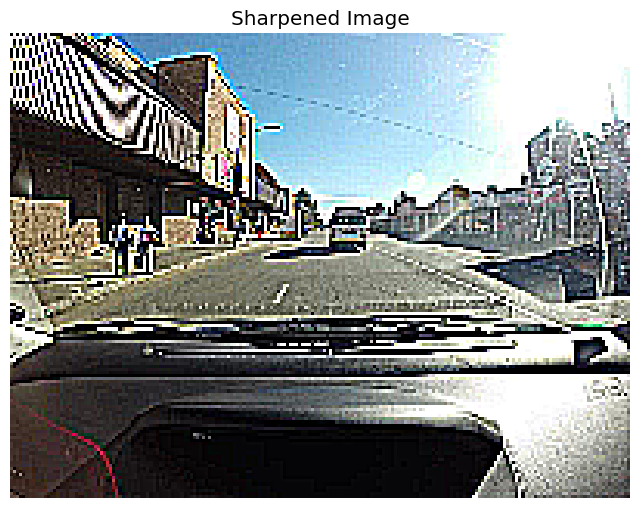

-------
Order is  9
diaplay image RGB


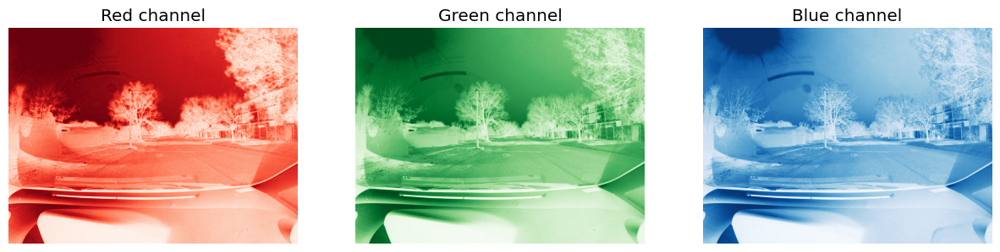

Converting from BRG to RGB


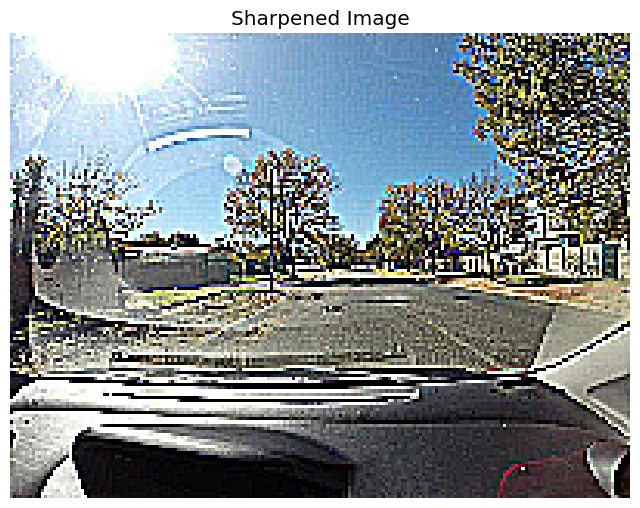

-------
Order is  10
diaplay image RGB


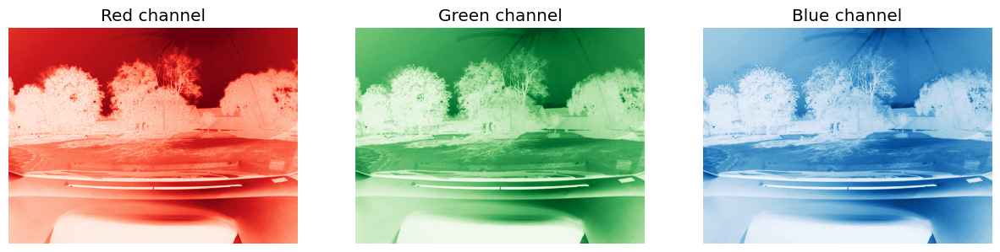

Converting from BRG to RGB


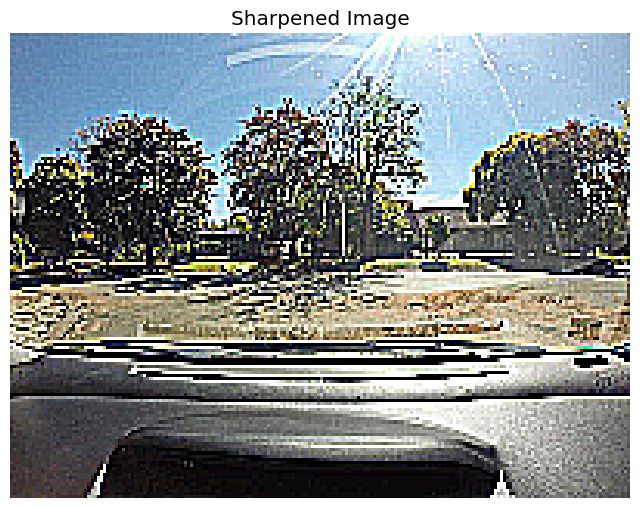

-------
Order is  11
diaplay image RGB


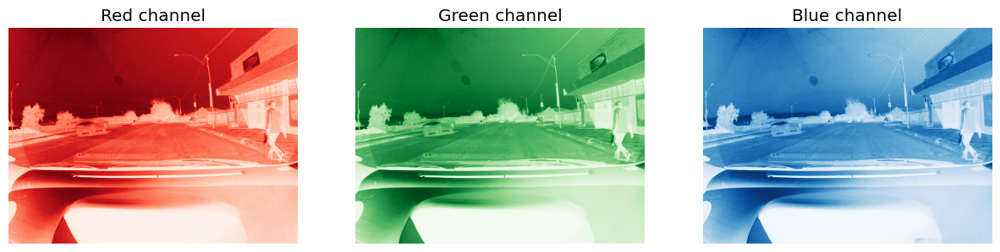

Converting from BRG to RGB


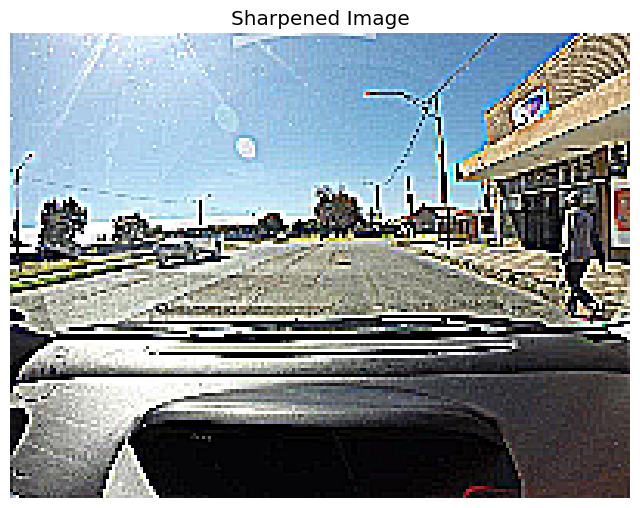

-------
Order is  12
diaplay image RGB


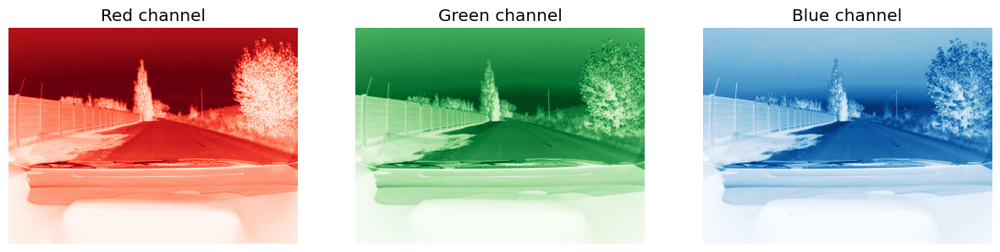

Converting from BRG to RGB


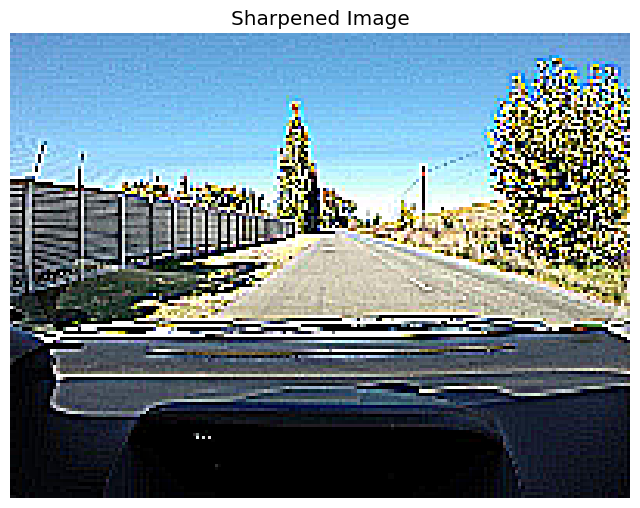

-------
Order is  13
diaplay image RGB


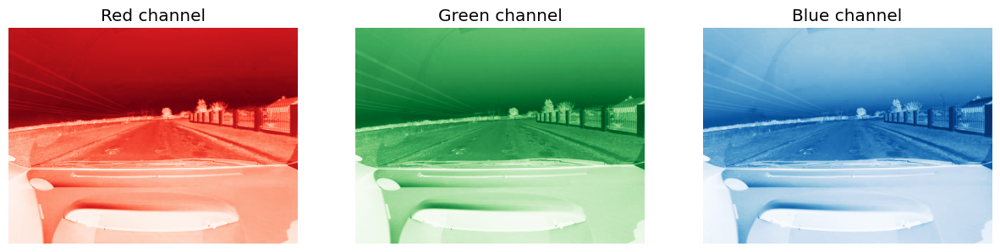

Converting from BRG to RGB


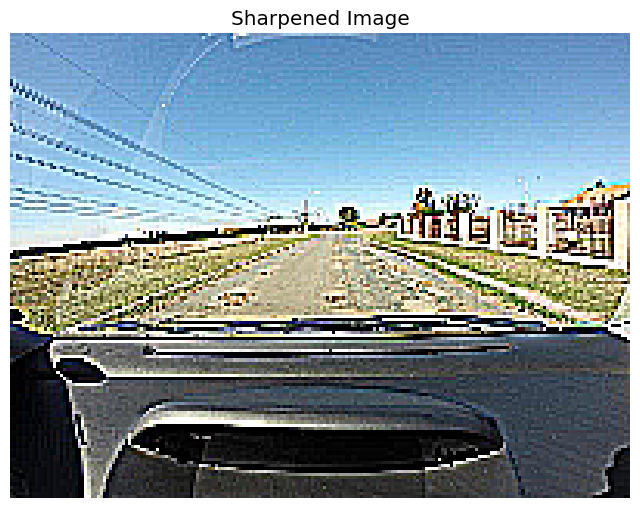

-------
Order is  14
diaplay image RGB


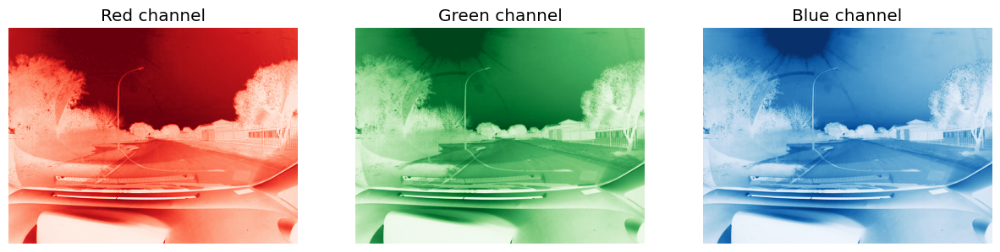

Converting from BRG to RGB


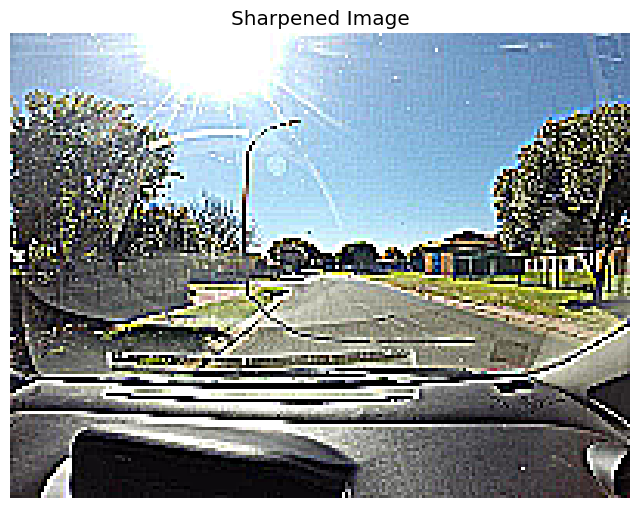

-------
Order is  15
diaplay image RGB


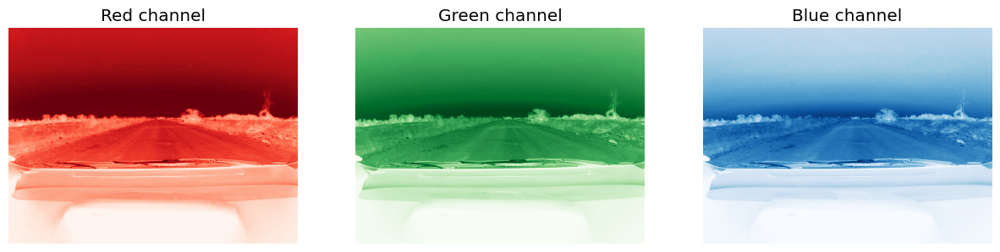

Converting from BRG to RGB


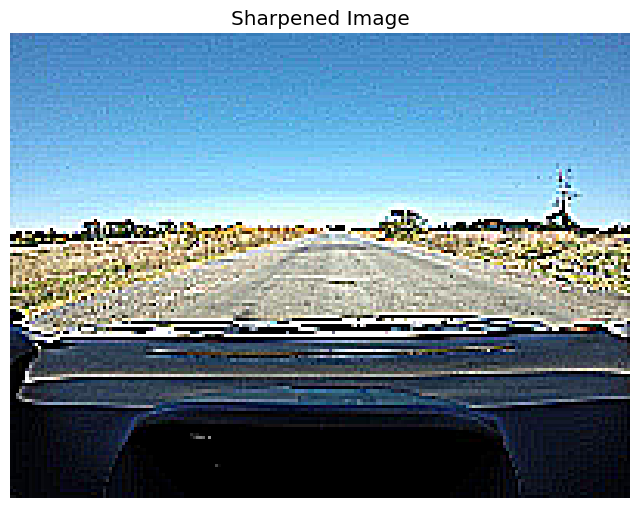

-------
Order is  16
diaplay image RGB


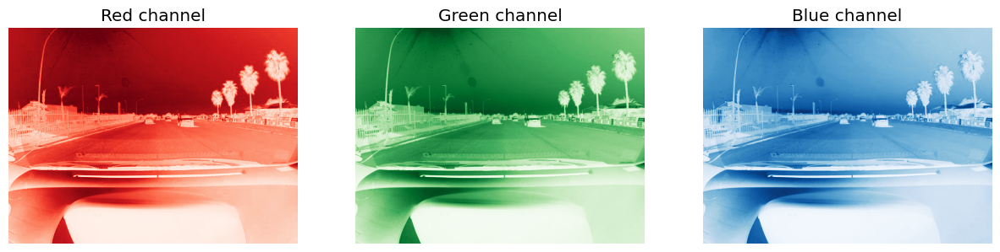

Converting from BRG to RGB


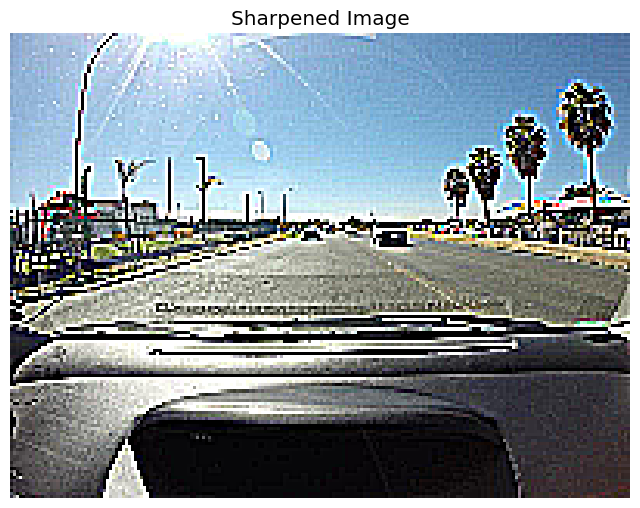

-------
Order is  17
diaplay image RGB


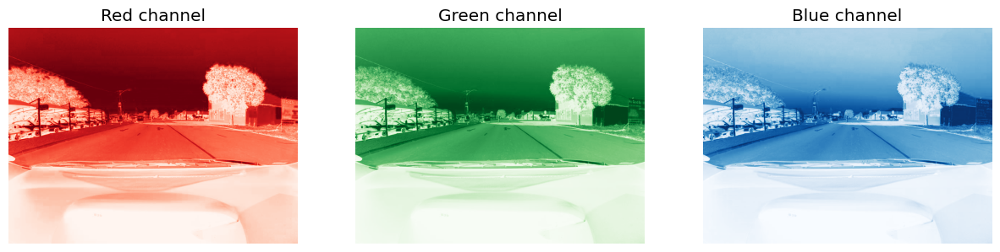

Converting from BRG to RGB


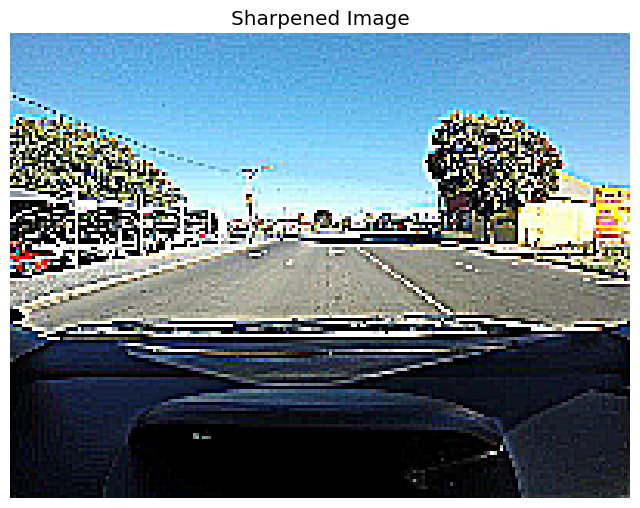

-------
Order is  18
diaplay image RGB


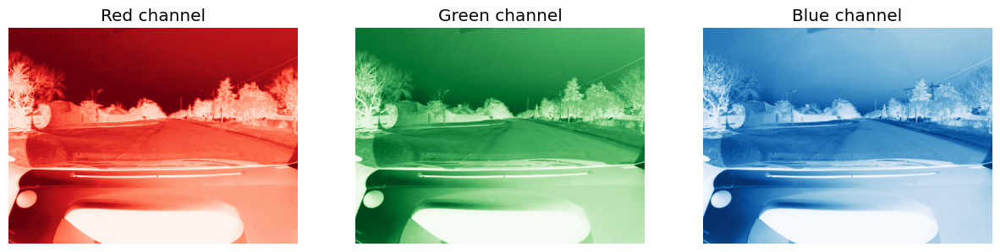

Converting from BRG to RGB


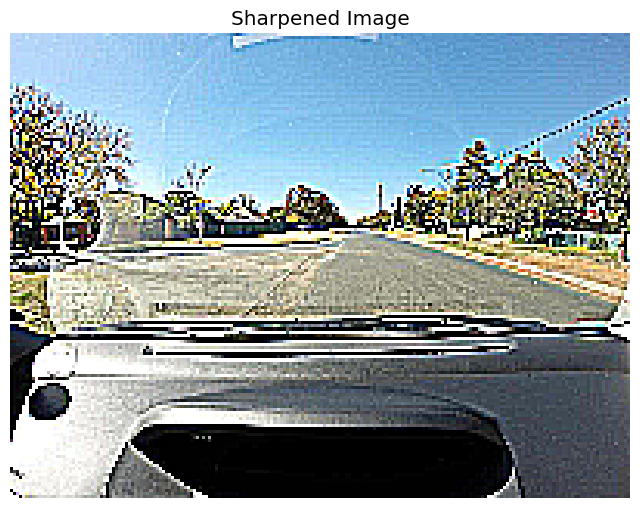

-------
Order is  19
diaplay image RGB


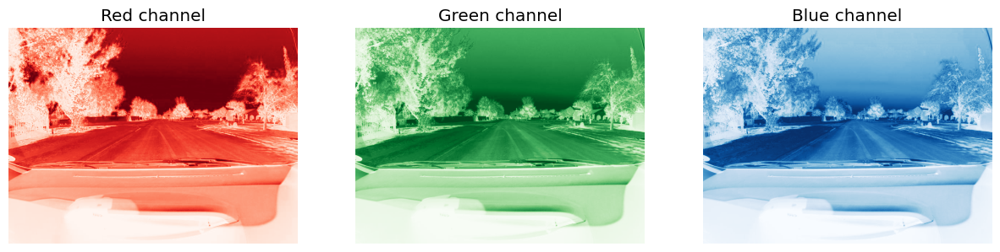

Converting from BRG to RGB


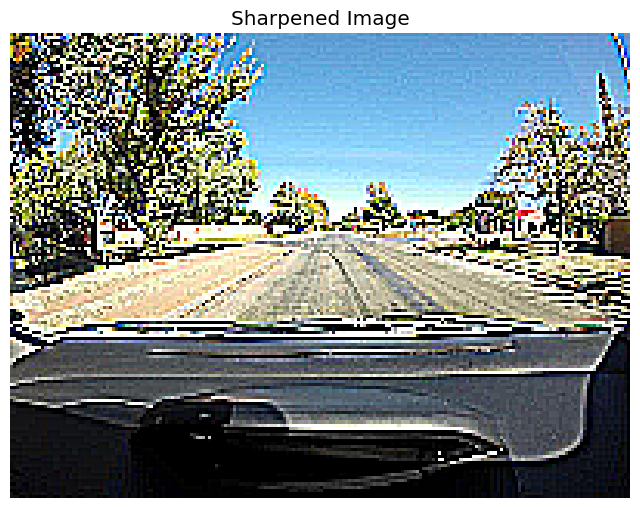

-------
Order is  20
diaplay image RGB


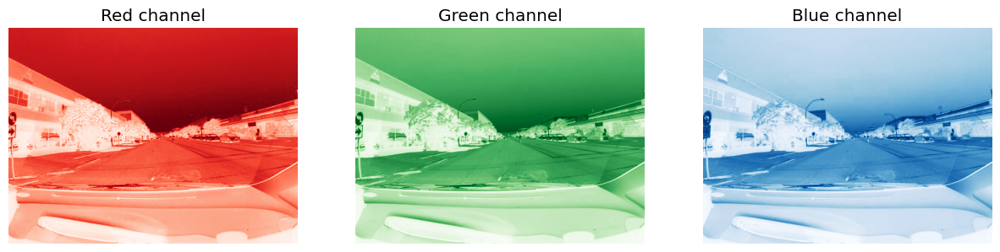

Converting from BRG to RGB


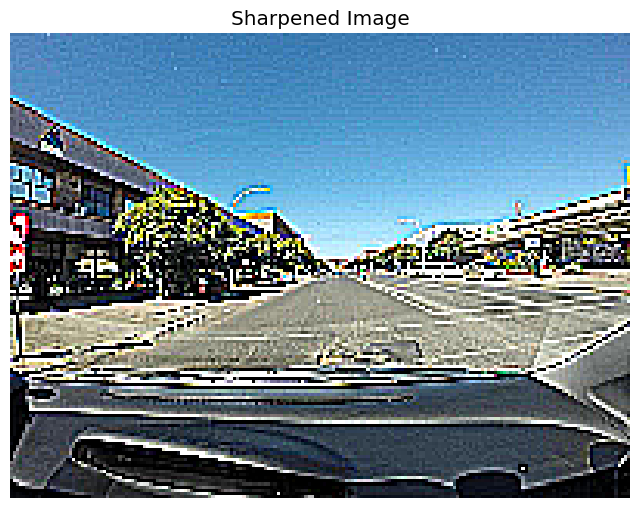

-------
Order is  21
diaplay image RGB


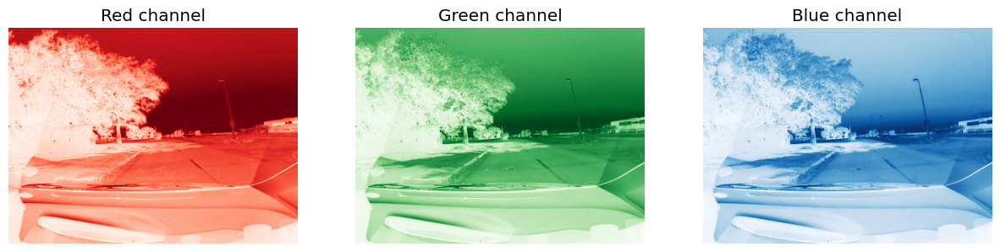

Converting from BRG to RGB


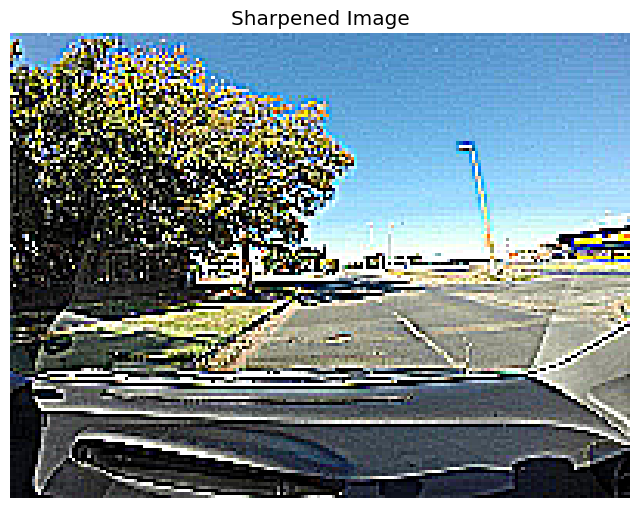

-------


In [ ]:
def read_tiff(image_path):
    image = io.imread(image_path)
    image = np.squeeze(image) # some images have unnecessary axes with shape 1 --> remove
    if image.shape[0] == 3: # some images have color as first axis -> swap axes
        image = image.swapaxes(0,1)
        image = image.swapaxes(1,2)
    return image

for i in range(len(df)):
  if (i not in list_of_duplicates) and (i not in list_of_broken_images) and (i not in list_of_outliers):
    img_cv2 = cv2.imread(df[i])

    #Display image's RGB
    print('Order is ',i)
    print('diaplay image RGB')
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(img_cv2[:,:,0], cmap='Reds')
    axs[1].imshow(img_cv2[:,:,1], cmap='Greens')
    axs[2].imshow(img_cv2[:,:,2], cmap='Blues')
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')
    axs[0].set_title('Red channel')
    axs[1].set_title('Green channel')
    axs[2].set_title('Blue channel')
    plt.show()

    read_tiff(df[i])

    # Resizing and Scaling
    img_resized = cv2.resize(img_cv2, None, fx=0.25, fy=0.25)

    #Converting from BGR to RGB
    print('Converting from BRG to RGB')
    img_resized = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)

    # Sharpen Image
    kernel_sharpening = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    sharpened = cv2.filter2D(img_resized, -1, kernel_sharpening)

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(sharpened)
    ax.axis('off')
    ax.set_title('Sharpened Image')
    plt.show()
    print('-------')